In [1]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
#colorsStates = ['orange','firebrick','forestgreen']#['orange','slateblue','forestgreen'] #['#FAA61A','#59C3C3','#9593D9','#99CC66','indigo'] #['darkorange','darkblue','forestgreen','purple']
colorsStates = ['tab:orange','tab:blue', 'tab:green','tab:red']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
# colormap = ['rebeccapurple','teal','darkturquoise','springgreen','gold']
# colormap = ['rebeccapurple','royalblue','limegreen','orange']
colormap = ['tab:purple','tab:pink','tab:cyan','yellowgreen']

In [7]:
labChosen =  ['angelakilab','churchlandlab','wittenlab']
dict_subjects = {'angelakilab':[],'churchlandlab':[],'wittenlab':[]}
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')
 
lab_identity = np.ones((len(subjectsAll))) * -1

for subject_idx in range(len(subjectsAll)):
    subject = subjectsAll[subject_idx]
    for z in range(len(labChosen)):
        lab = labChosen[z]
        subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
        if subject in subjects:
            lab_identity[subject_idx] = z

print(subjectsAll)
print(lab_identity)

['IBL-T1', 'IBL-T2', 'IBL-T3', 'IBL-T4', 'NYU-02', 'NYU-04', 'NYU-07', 'NYU-09', 'NYU-12', 'NYU-13', 'CSHL_001', 'CSHL_002', 'CSHL_003', 'CSHL_004', 'CSHL_005', 'CSHL_006', 'CSHL_008', 'CSHL_010', 'CSHL_012', 'CSHL_014', 'CSHL_015', 'ibl_witten_02', 'ibl_witten_03', 'ibl_witten_04', 'ibl_witten_05', 'ibl_witten_06', 'ibl_witten_07', 'ibl_witten_12', 'ibl_witten_13', 'ibl_witten_14', 'ibl_witten_15', 'ibl_witten_16', 'IBL-T1', 'IBL-T2', 'IBL-T3', 'IBL-T4', 'NYU-02', 'NYU-04', 'NYU-07', 'NYU-09', 'NYU-12', 'NYU-13', 'CSHL_001', 'CSHL_002', 'CSHL_003', 'CSHL_004', 'CSHL_005', 'CSHL_006', 'CSHL_008', 'CSHL_010', 'CSHL_012', 'CSHL_014', 'CSHL_015', 'ibl_witten_02', 'ibl_witten_03', 'ibl_witten_04', 'ibl_witten_05', 'ibl_witten_06', 'ibl_witten_07', 'ibl_witten_12', 'ibl_witten_13', 'ibl_witten_14', 'ibl_witten_15', 'ibl_witten_16', 'IBL-T1', 'IBL-T2', 'IBL-T3', 'IBL-T4', 'NYU-02', 'NYU-04', 'NYU-07', 'NYU-09', 'NYU-12', 'NYU-13', 'CSHL_001', 'CSHL_002', 'CSHL_003', 'CSHL_004', 'CSHL_005', '

In [3]:
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
bestSigmaInd = 7
bestAlpha = 2
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5
inits = 21

In [ ]:
# Different color for each lab
colors_labs = ['tab:yellow','tab:red','tab:purple']

In [8]:
# INIT 0 means initialized from global fit
K = 3
allW = np.empty((len(subjectsAll)), dtype=object)
allP = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    param = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}_state_alpha={bestAlpha}_multiple-initsP_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] =  param['allP'][0] # starting from best dGLMHMM1 fit
    allW[idx] =  param['allW'][0] # starting from best dGLMHMM1 fit
    

/var/folders/w4/p225s7cd19n0j6tss7pdl21w0000gn/T/ipykernel_80938/1884191274.py:32: RuntimeWarning: Mean of empty slice
  axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)


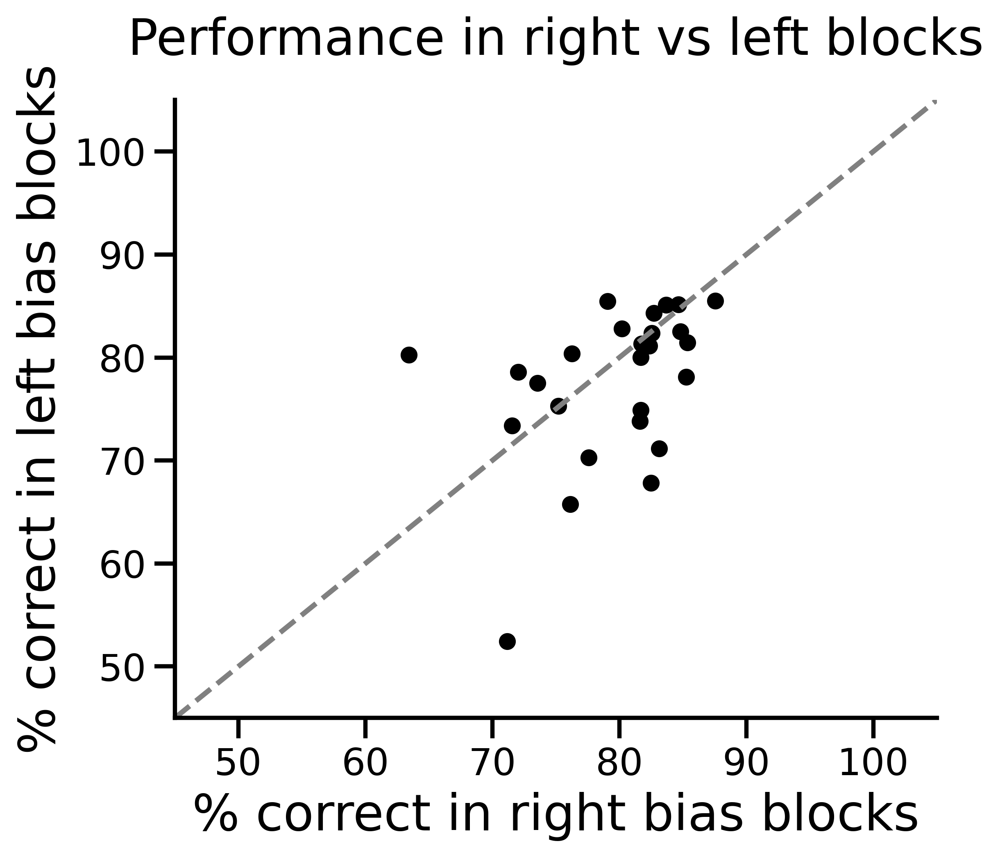

In [4]:
# performance in right vs left blocks
rightBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
leftBiasPerformance = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    N = x.shape[0]

    correctChoice = (y == correctSide).astype(int) # 1 if animal made correct choice
    sess = len(sessInd)-1
    rightBiasPerformance[idx] = np.zeros((sess))
    leftBiasPerformance[idx] = np.zeros((sess))
    for s in range(0,sess):
        biasedRight = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==1)
        if biasedRight.sum() > 0:
            rightBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedRight==True)].sum() / biasedRight.sum()
        else: 
            rightBiasPerformance[idx][s] = np.nan
        
        biasedLeft = (biasedBlockTrials[sessInd[s]:sessInd[s+1]]==-1)
        if biasedLeft.sum() > 0:
            leftBiasPerformance[idx][s] = correctChoice[sessInd[s]+np.argwhere(biasedLeft==True)].sum() / biasedLeft.sum()
        else: 
            leftBiasPerformance[idx][s] = np.nan

# plotting right bias performance vs left bias performance across animals avereaged across sessions
fig, axes = fig, axes = plt.subplots(1, figsize = (6,5), dpi=400)
axes.set_xlabel('% correct in right bias blocks', size=22)
axes.set_ylabel('% correct in left bias blocks', size=22)
for idx in range(0,len(subjectsAll)):
    axes.scatter(np.nanmean(rightBiasPerformance[idx])*100, np.nanmean(leftBiasPerformance[idx])*100, color='black', s=35)
    # ADD DIFFERENT COLOR FOR EACH LAB
axes.set_xlim(45,105)
axes.set_ylim(45,105)
axes.plot([0, 1], [0, 1], transform=axes.transAxes, linestyle='dashed', color='gray')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Performance in right vs left blocks', size=25, pad=20)
plt.savefig(f'../figures/Correct_Right_Vs_Left_ScatterPlot', bbox_inches='tight', dpi=400)

In [9]:
# Computing posterior latents across animals
allGamma = np.empty((len(subjectsAll)), dtype=object)
K = 3
truepi = np.ones((K))
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    presentAll = np.ones((N))
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allGamma[idx] = dGLM_HMM.get_posterior_latent(allP[idx], truepi, allW[idx], x, y, presentAll, sessInd, sortedStateInd=None)

In [11]:
allPhi = np.empty((len(subjectsAll)), dtype=object) # observation probabilities
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    dGLMHMM2 = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allPhi[idx] = dGLMHMM2.observation_probability(x, allW[idx])

/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:358: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py

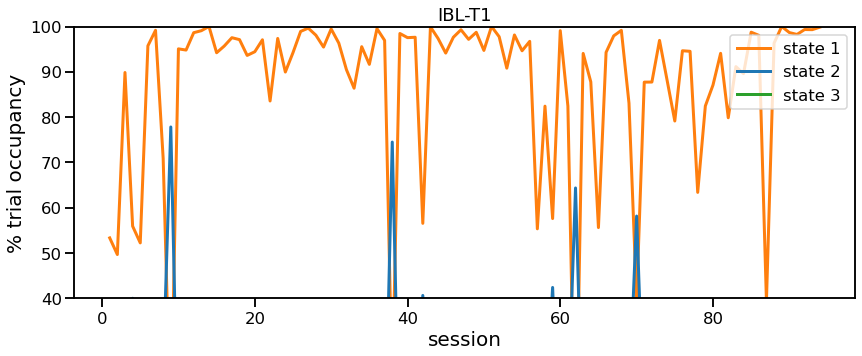

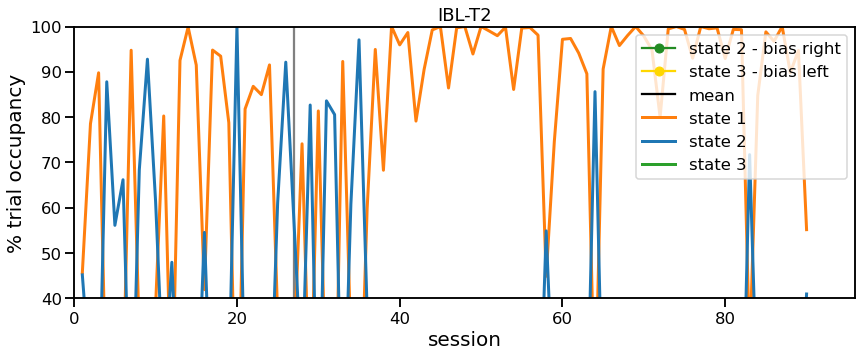

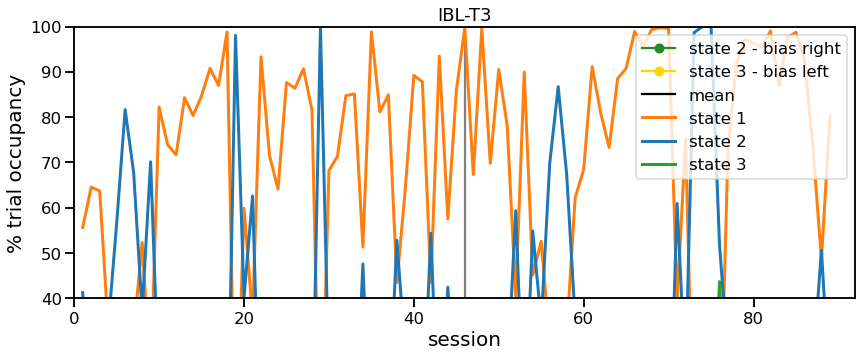

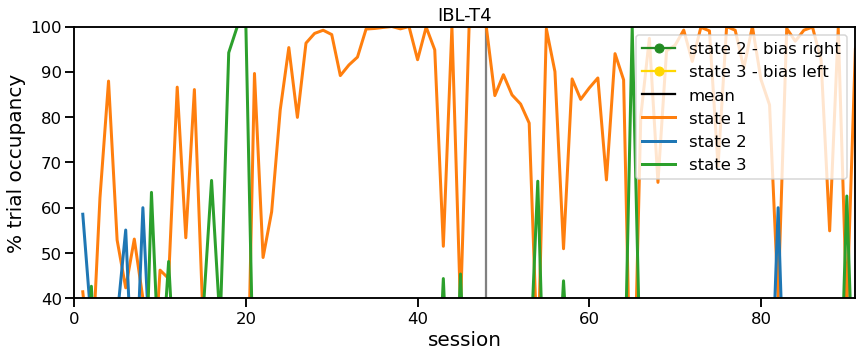

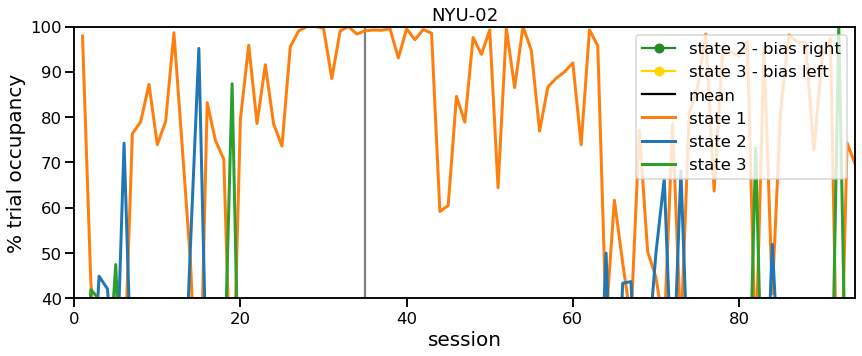

...

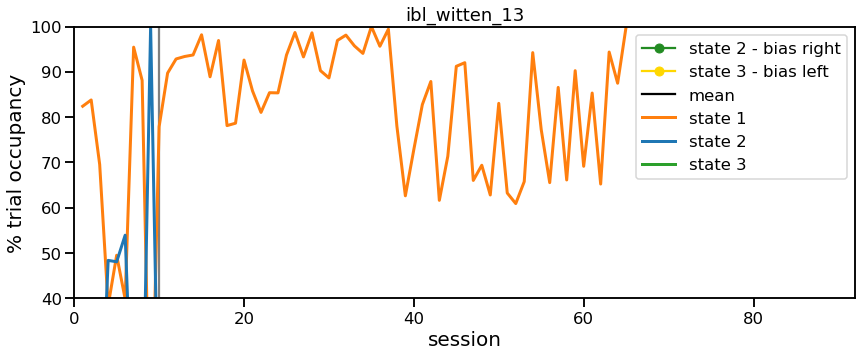

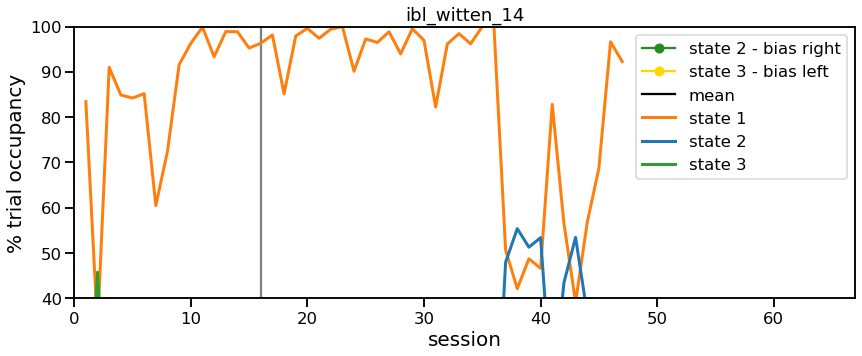

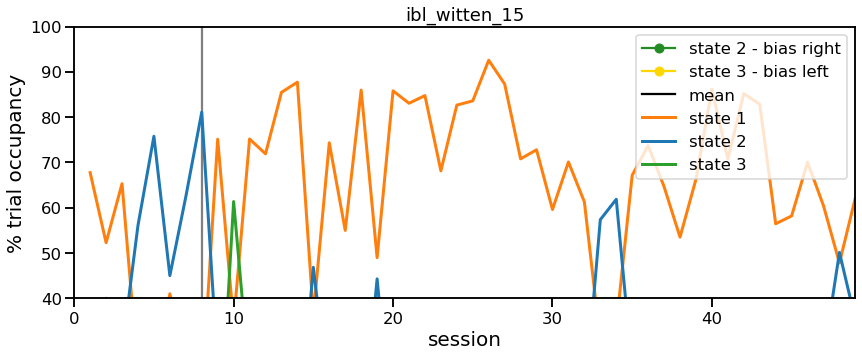

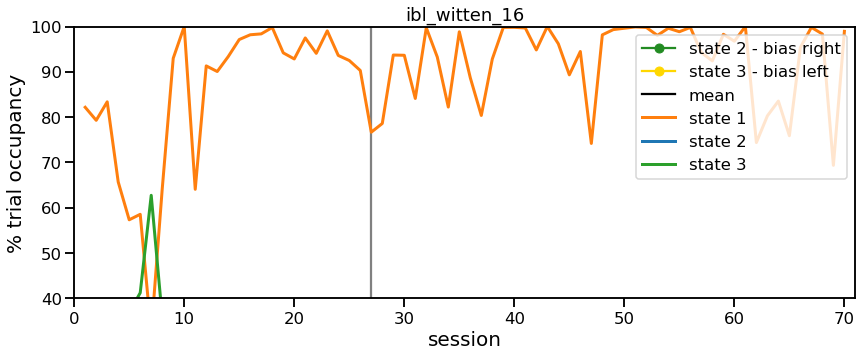

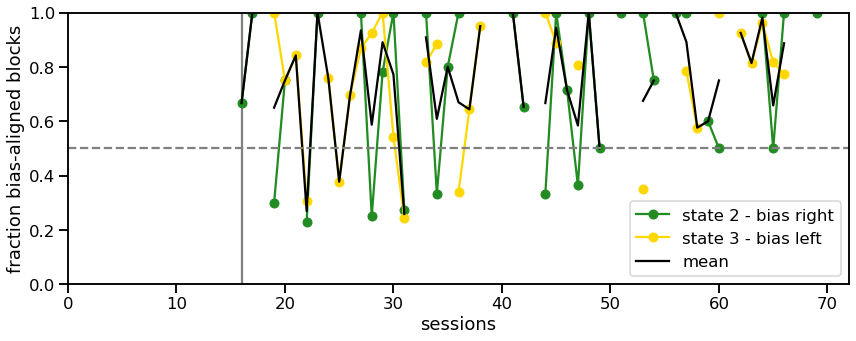

In [12]:
K = 3
allStateCount = np.empty((len(subjectsAll)), dtype=object)
allStateCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallMixtureCorrect = np.empty((len(subjectsAll)), dtype=object)
allStateCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object) # separate for easy trials and hard trials
allOverallCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object) # separate for easy trials and hard trials
blocksStateRight = np.empty((len(subjectsAll)), dtype=object)
blocksStateLeft = np.empty((len(subjectsAll)), dtype=object)

allEmpiricalCorrect = np.empty((len(subjectsAll)), dtype=object)
allEmpiricalCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object)

fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    # Plotting task occupancy of each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCount[idx] = plot_state_occupancy_sessions(allGamma[idx], sessInd, axes, colors=colorsStates)
    axes.set_ylim(-1,101)

    # plotting task accuracy in each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    _, _, allOverallCorrect[idx], allStateCorrect[idx] = accuracy_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)
    axes.set_ylim(40,100)

    # allOverallMixtureCorrect[idx] = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

    # calculating performance on easy trials for each state
    data = dfAll[dfAll['subject']==subject]
    dateToKeep = np.unique(data['date'])[0:sessStop]    
    dataTemp = pd.DataFrame(data.loc[data['date'].isin(list(dateToKeep))])
    contrastLeft=np.array(dataTemp['contrastLeft'])
    contrastRight=np.array(dataTemp['contrastRight'])
    easyTrials = (contrastLeft > 0.45).astype(int) | (contrastRight > 0.45).astype(int)
    correctSidee = np.array(dataTemp['correctSide'])

    # computing per state accuracy for easy trials
    N = y.shape[0]
    p_correct_states = np.ma.empty((N, K, 2)) # separate for easy and hard trials (last column) # 1 = easy, 0 = hard
    p_correct = np.ma.empty((N, 2))
    p_correct_states_sessions = np.ma.empty((len(sessInd)-1, K, 2))
    p_correct_sessions = np.ma.empty((len(sessInd)-1, 2))

    p_correct_states.mask = True
    p_correct.mask = True
    p_correct_states_sessions.mask = True
    p_correct_sessions.mask = True

    for session in range(0, len(sessInd)-1):
        for t in range(sessInd[session],sessInd[session+1]):
            for k in range(0,K):
                p_correct_states[t, k, easyTrials[t]] = allPhi[idx][t, k, correctSide[t]]
            if (np.ma.is_masked(p_correct_states[t, 0, 0]) == False): # means trial happened (not masked)
                p_correct[t, 0] = p_correct_states[t, :, 0] @ allGamma[idx][t] # hard trials
            if (np.ma.is_masked(p_correct_states[t, 0, 1]) == False): # means trial happened (not masked)
                p_correct[t, 1] = p_correct_states[t, :, 1] @ allGamma[idx][t] # easy trials
    
        p_correct_states_sessions[session] = np.nanmean(p_correct_states[sessInd[session]:sessInd[session+1]], axis=0) 
        p_correct_sessions[session] = np.nanmean(p_correct[sessInd[session]:sessInd[session+1]], axis=0)

    allStateCorrectSeparate[idx, 0] = 100 * p_correct_states_sessions[:, :, 0] # hard
    allStateCorrectSeparate[idx, 1] = 100 * p_correct_states_sessions[:, :, 1] # easy
    allOverallCorrectSeparate[idx, 0] = 100 * p_correct_sessions[:, 0]
    allOverallCorrectSeparate[idx, 1] = 100 * p_correct_sessions[:, 1]

    # # empirical accuracy
    # empiricalAccuracy = np.zeros((len(sessInd)-1))
    # correct = correctSide == y
    # for s in range(0,len(sessInd)-1):
    #     empiricalAccuracy[s] = np.mean(correct[sessInd[s]:sessInd[s+1]]) * 100
    # allEmpiricalCorrect[idx] = empiricalAccuracy

    # empiricalCorrectSeparate = np.ma.empty((N, 2))
    # empiricalCorrectSeparate.mask = True
    # empiricalCorrectSeparateSession = np.ma.empty((len(sessInd)-1, 2))
    # empiricalCorrectSeparateSession.mask = True
    # for session in range(0, len(sessInd)-1):
    #     for t in range(sessInd[session],sessInd[session+1]):
    #         empiricalCorrectSeparate[t, easyTrials[t]] = correct[t]
    #     empiricalCorrectSeparateSession[session] = np.nanmean(empiricalCorrectSeparate[sessInd[session]:sessInd[session+1]], axis=0)
    # allEmpiricalCorrectSeparate[idx, 0] = 100 * empiricalCorrectSeparateSession[:, 0]
    # allEmpiricalCorrectSeparate[idx, 1] = 100 * empiricalCorrectSeparateSession[:, 1]

    # Plotting alignment of biased states with biased blocks
    fig, axes = plt.subplots(1, figsize=(14,5))
    blocksStateRight[idx], blocksStateLeft[idx] = plot_aligned_fraction_blocks_state(allGamma[idx], sessInd, biasedBlockTrials, biasedBlockSession, axes)
    axes.axvline(firstBlockSession+1, color='gray', zorder=0)

In [ ]:
# Average across animals of bias-block alignment with first biased session aligned across animals
maxSess = 50
bestSigmaInd = 7
K = 3

arrAlignRight = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignRight.mask = True

arrAlignLeft = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignLeft.mask = True

fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_title('Alignment of biased states with corresponding biased blocks', size=22, pad=15)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrAlignRight[:stop-firstBlockSession, idx] = blocksStateRight[idx][firstBlockSession:stop]
        arrAlignLeft[:stop-firstBlockSession, idx] = blocksStateLeft[idx][firstBlockSession:stop]
        
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignRight[:,:], axis=1), '-o', color=colorsStates[1], label='state 2 - bias right', alpha=1)
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignLeft[:,:], axis=1), '-o', color=colorsStates[2], label='state 3 - bias left', alpha=1)
# axes.plot(range(1,maxSess+1), (np.nanmean(arrAlignRight[:,:], axis=1)+np.nanmean(arrAlignLeft[:,:], axis=1))/2, '-o', color='black',label='mean')
axes.legend()
axes.set_xlim(0,maxSess+1)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_ylim(0,1)
axes.set_xlabel('sessions with biased blocks')
axes.set_ylabel('fraction aligned')
axes.spines[['right', 'top']].set_visible(False)
plt.savefig(f'../figures/Fraction_Aligned_States-and-Blocks_allAnimals', bbox_inches='tight', dpi=400)


In [ ]:
# ALIGNED TO BIASED BLOCKS
fig, axes = plt.subplots(2, figsize = (12,10), sharex=True, dpi=400) 
maxSess = 50
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess+9,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    if (np.isnan(firstBlockSession) == False and firstBlockSession >= 9):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCount[:stop-firstBlockSession+9, :K, idx] = allStateCount[idx][firstBlockSession-9:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes[0].plot(range(-9,maxSess), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[0].fill_between(range(-9,maxSess), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes[0].set_ylabel('% trial occupancy')
axes[0].set_xlabel('')
axes[0].set_ylim(0,100)
axes[0].legend(loc='upper left')

arrStateCorrect = np.ma.empty((maxSess+9,K,len(subjectsAll)))
arrStateCorrect.mask = True

axes[1].axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    if (np.isnan(firstBlockSession) == False and firstBlockSession >= 9):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrStateCorrect[:stop-firstBlockSession+9, :K, idx] = allStateCorrect[idx][firstBlockSession-9:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
 
for k in range(0,K):
    axes[1].plot(range(-9,maxSess), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes[1].fill_between(range(-9,maxSess), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes[1].set_ylabel('% task accuracy')
axes[1].set_xlabel('sessions with bias blocks')
axes[1].set_ylim(45,100)
axes[1].legend(loc='upper left')
axes[0].spines[['right', 'top']].set_visible(False)
axes[1].spines[['right', 'top']].set_visible(False)
axes[0].set_title('Occupancy and accuracy across states during bias block sessions', size=22, pad=40)
axes[0].get_legend().remove()
axes[1].get_legend().remove()
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals-biasblocks', bbox_inches='tight', dpi=400)
